# Problem Statement

### You are tasked with predicting the likelihood of a student receiving a job offer based on their skills, previous experience, and course performance. This will help recruiters identify the most promising candidates at the job fair.

### Import necessary libraries

In [1]:
import pandas as pd
import numpy as np
pd.plotting.register_matplotlib_converters()
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
print("Setup Complete")

Setup Complete


### Read the dataset

In [2]:
dataset = pd.read_csv('./dataset/student_job_fair_data.csv', index_col='student_id')

In [3]:
dataset.head()

,skills,experience_years,course_grades,projects_completed,extracurriculars,job_offer
student_id,,,,,,
1,Python;Data Analysis;SQL,3,75.26,9,0,1
2,Java,4,74.25,6,2,1
3,Data Analysis,2,74.89,4,3,0
4,Data Analysis,4,72.73,2,3,1
5,Machine Learning;Python;C++,4,84.85,1,4,0


In [4]:
dataset.shape

(20000, 6)

## Exploratory Data Analysis(EDA)

In [5]:
dataset.columns

Index(['skills', 'experience_years', 'course_grades', 'projects_completed',
       'extracurriculars', 'job_offer'],
      dtype='object')

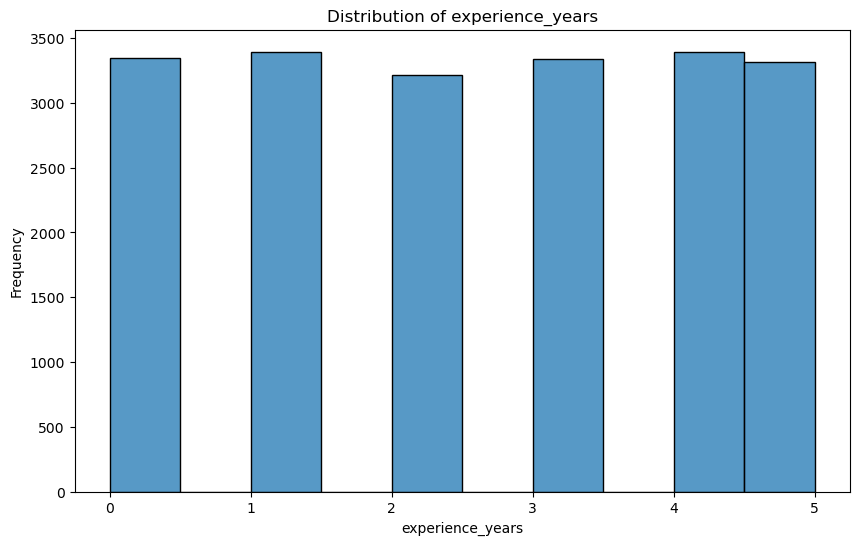

In [6]:
plt.figure(figsize=(10, 6))
sns.histplot(x=dataset['experience_years'], kde=False, bins=10)
plt.title('Distribution of experience_years')
plt.xlabel('experience_years')
plt.ylabel('Frequency')
plt.show()

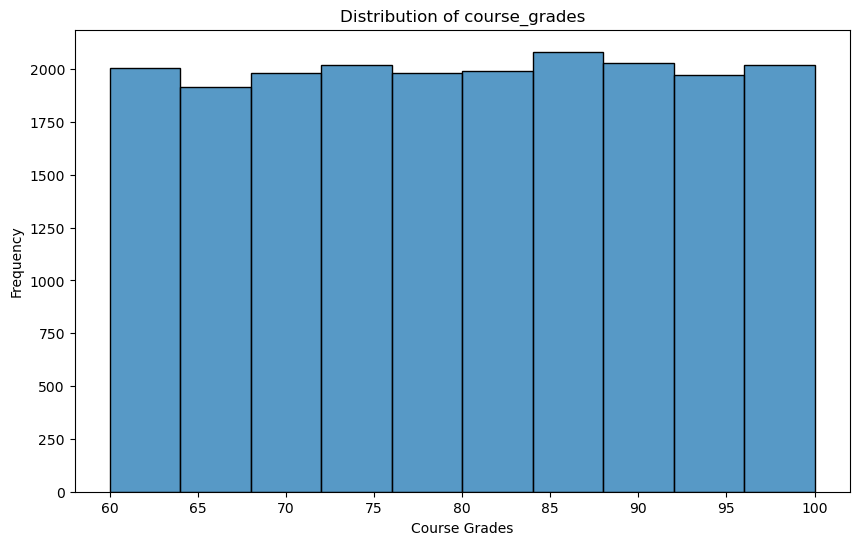

In [7]:
plt.figure(figsize=(10, 6))
sns.histplot(dataset['course_grades'], kde=False, bins=10)
plt.title('Distribution of course_grades')
plt.xlabel('Course Grades')
plt.ylabel('Frequency')
plt.show()

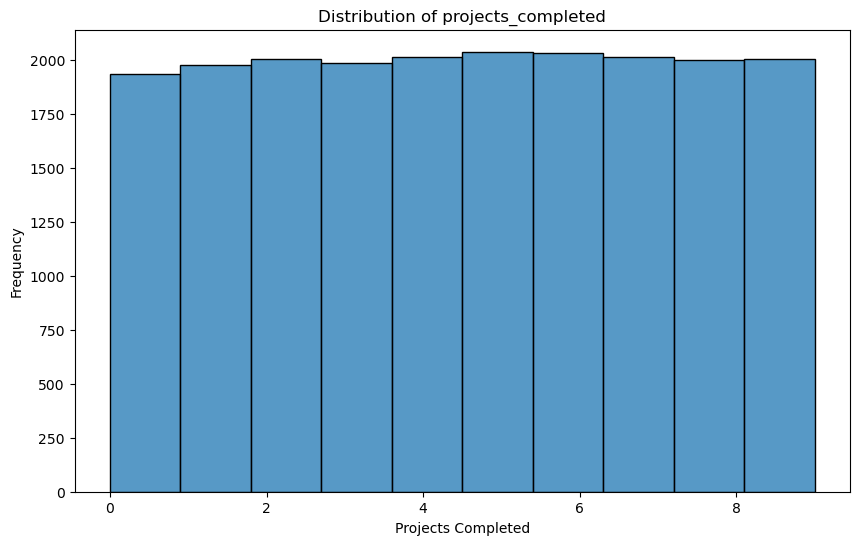

In [8]:
plt.figure(figsize=(10, 6))
sns.histplot(dataset['projects_completed'], kde=False, bins=10)
plt.title('Distribution of projects_completed')
plt.xlabel('Projects Completed')
plt.ylabel('Frequency')
plt.show()

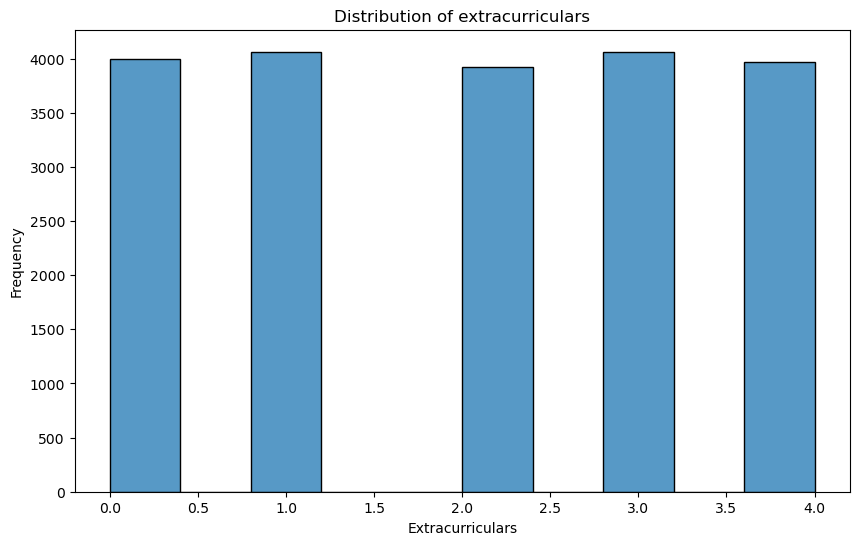

In [9]:
plt.figure(figsize=(10, 6))
sns.histplot(dataset['extracurriculars'], kde=False, bins=10)
plt.title('Distribution of extracurriculars')
plt.xlabel('Extracurriculars')
plt.ylabel('Frequency')
plt.show()

Text(0.5, 1.0, 'Checking Imbalance in Training Data Or Response')

<Figure size 600x600 with 0 Axes>

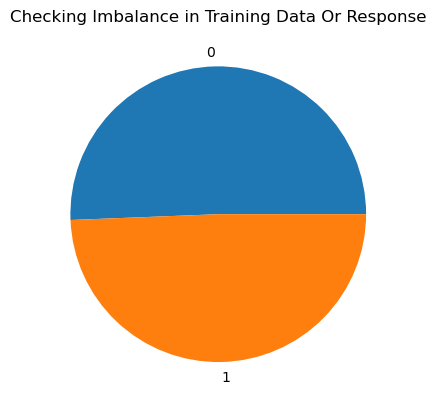

In [10]:
job_fair_data = dataset['job_offer'].value_counts()
plt.figure(figsize=(6,6))
fig, ax = plt.subplots()
ax.pie(job_fair_data, labels = [0,1])
ax.set_title('Checking Imbalance in Training Data Or Response')

### Good! the pie chart shows that the data is balanced 

## 1.Data Preprocessing

In [11]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20000 entries, 1 to 20000
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   skills              20000 non-null  object 
 1   experience_years    20000 non-null  int64  
 2   course_grades       20000 non-null  float64
 3   projects_completed  20000 non-null  int64  
 4   extracurriculars    20000 non-null  int64  
 5   job_offer           20000 non-null  int64  
dtypes: float64(1), int64(4), object(1)
memory usage: 1.6+ MB


In [12]:
missing_values = dataset.isnull().sum()
missing_values

skills                0
experience_years      0
course_grades         0
projects_completed    0
extracurriculars      0
job_offer             0
dtype: int64

### It seems that there are no missing values  

### Check for duplicates

In [13]:
dataset.duplicated().sum()

2

### It seems that the dataset contains to duplicate records

#### Remove duplicates

In [14]:
dataset.drop_duplicates(inplace = True)

In [15]:
# Make sure that the duplicates are removed
dataset.duplicated().sum()

0

## Handle categorical features

#### It seems that there is ONLY one categorical feature which is <b>[skills]</b> feature  

In [16]:
dataset_encoded = pd.get_dummies(dataset, columns=['skills', ])

In [17]:
dataset_encoded.head(10)

,experience_years,course_grades,projects_completed,extracurriculars,job_offer,skills_C++,skills_C++;Data Analysis,skills_C++;Data Analysis;Java,skills_C++;Data Analysis;Machine Learning,skills_C++;Data Analysis;Python,...,skills_SQL;Machine Learning,skills_SQL;Machine Learning;C++,skills_SQL;Machine Learning;Data Analysis,skills_SQL;Machine Learning;Java,skills_SQL;Machine Learning;Python,skills_SQL;Python,skills_SQL;Python;C++,skills_SQL;Python;Data Analysis,skills_SQL;Python;Java,skills_SQL;Python;Machine Learning
student_id,,,,,,,,,,,,,,,,,,,,,
1,3,75.26,9,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,4,74.25,6,2,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2,74.89,4,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,72.73,2,3,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,4,84.85,1,4,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,66.57,7,3,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,2,93.84,1,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,2,92.50,7,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,2,79.06,4,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [18]:
# Move target column [job_offer] to the last index
dataset_encoded = dataset_encoded.reindex(columns = [col for col in dataset_encoded.columns if col != 'job_offer'] + ['job_offer'])
dataset_encoded.head()

,experience_years,course_grades,projects_completed,extracurriculars,skills_C++,skills_C++;Data Analysis,skills_C++;Data Analysis;Java,skills_C++;Data Analysis;Machine Learning,skills_C++;Data Analysis;Python,skills_C++;Data Analysis;SQL,...,skills_SQL;Machine Learning;C++,skills_SQL;Machine Learning;Data Analysis,skills_SQL;Machine Learning;Java,skills_SQL;Machine Learning;Python,skills_SQL;Python,skills_SQL;Python;C++,skills_SQL;Python;Data Analysis,skills_SQL;Python;Java,skills_SQL;Python;Machine Learning,job_offer
student_id,,,,,,,,,,,,,,,,,,,,,
1,3,75.26,9,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,4,74.25,6,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,2,74.89,4,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,72.73,2,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,4,84.85,1,4,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## 2.Model Building

### 2.1. Split the dataset with 80% for training and 20% for testing

In [19]:
X = dataset_encoded.iloc[:, :-1] 

In [20]:
X.shape

(19998, 160)

In [21]:
y = dataset_encoded.iloc[:, -1]

In [22]:
y.shape

(19998,)

## Apply feature scaling

In [23]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X)


In [24]:
from sklearn.model_selection import train_test_split
RANDOM_STATE = 42
X_train, X_test, y_train, y_test = train_test_split(X_train_scaled, y, 
                                                    test_size=0.2, random_state=RANDOM_STATE)

In [25]:
(X_train.shape, y_train.shape), (X_test.shape, y_test.shape)

(((15998, 160), (15998,)), ((4000, 160), (4000,)))

In [26]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
print("Setup Completed!")

Setup Completed!


### 2.2. Apply Random Forest , as it is the best tree ensemble

In [27]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import RocCurveDisplay, roc_curve
from sklearn.metrics import roc_auc_score
from sklearn import metrics
print("Setup Completed!")

Setup Completed!


#### <a name='2.2.1'></a> Let's try different values of random forest paramteres and see how they affect the accuracy 

In [28]:
min_samples_split_list = [2,10, 30, 50, 100, 200, 300, 700] 
                                             
max_depth_list = [2, 4, 8, 16, 32, 64, None]
n_estimators_list = [100,200,400,500]

#### 2.2.1. For min_sample_split

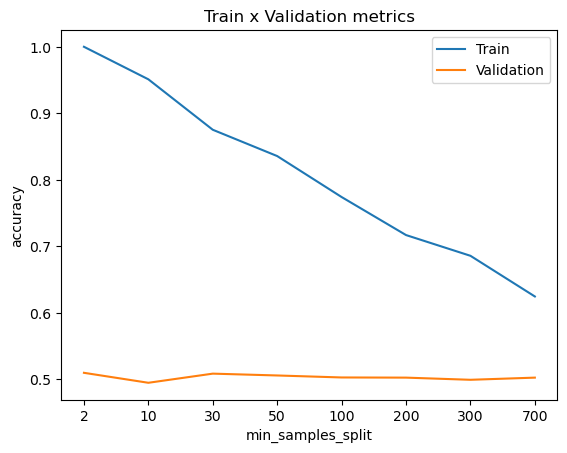

In [29]:
accuracy_list_train = []
accuracy_list_val = []
for min_samples_split in min_samples_split_list:
    # You can fit the model at the same time you define it, because the fit function returns the fitted estimator.
    model = RandomForestClassifier(min_samples_split = min_samples_split,
                                   random_state = RANDOM_STATE).fit(X_train,y_train) 
    predictions_train = model.predict(X_train) ## The predicted values for the train dataset
    predictions_val = model.predict(X_test) ## The predicted values for the test dataset
    accuracy_train = accuracy_score(predictions_train,y_train)
    accuracy_val = accuracy_score(predictions_val,y_test)
    accuracy_list_train.append(accuracy_train)
    accuracy_list_val.append(accuracy_val)

plt.title('Train x Validation metrics')
plt.xlabel('min_samples_split')
plt.ylabel('accuracy')
plt.xticks(ticks = range(len(min_samples_split_list )),labels=min_samples_split_list) 
plt.plot(accuracy_list_train)
plt.plot(accuracy_list_val)
plt.legend(['Train','Validation'])

#### <b>Notice that, the highest accuracy for both validation and training are at min_samples_split = 2</b>

#### 2. For max_depth

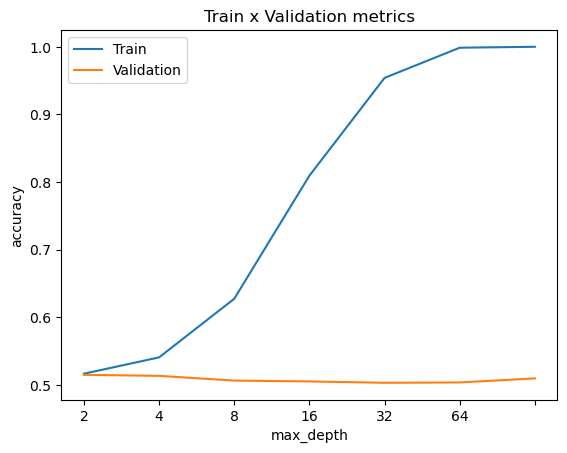

In [49]:
accuracy_list_train = []
accuracy_list_val = []
for max_depth in max_depth_list:
    # You can fit the model at the same time you define it, because the fit function returns the fitted estimator.
    model = RandomForestClassifier(max_depth = max_depth,
                                   random_state = RANDOM_STATE).fit(X_train,y_train) 
    predictions_train = model.predict(X_train) ## The predicted values for the train dataset
    predictions_val = model.predict(X_test) ## The predicted values for the test dataset
    accuracy_train = accuracy_score(predictions_train,y_train)
    accuracy_val = accuracy_score(predictions_val,y_test)
    accuracy_list_train.append(accuracy_train)
    accuracy_list_val.append(accuracy_val)

plt.title('Train x Validation metrics')
plt.xlabel('max_depth')
plt.ylabel('accuracy')
plt.xticks(ticks = range(len(max_depth_list )),labels=max_depth_list)
plt.plot(accuracy_list_train)
plt.plot(accuracy_list_val)
plt.legend(['Train','Validation'])

#### <b> Notice that the highest accuracy for validation is at max_depth = 2, but for training max_depth = 64  </b>

#### 3. For n_estimtors

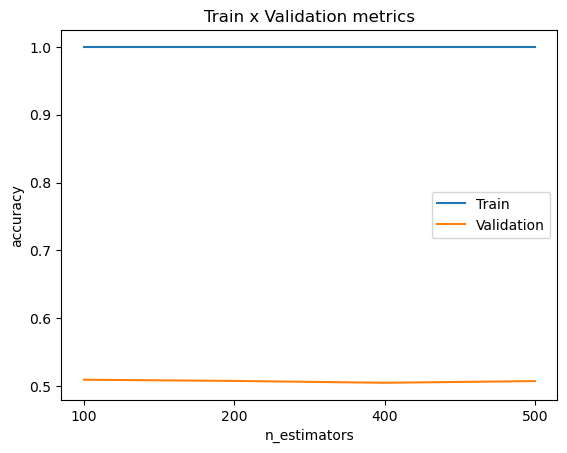

In [50]:
accuracy_list_train = []
accuracy_list_val = []
for n_estimators in n_estimators_list:
    # You can fit the model at the same time you define it, because the fit function returns the fitted estimator.
    model = RandomForestClassifier(n_estimators = n_estimators,
                                   random_state = RANDOM_STATE).fit(X_train,y_train) 
    predictions_train = model.predict(X_train) ## The predicted values for the train dataset
    predictions_val = model.predict(X_test) ## The predicted values for the test dataset
    accuracy_train = accuracy_score(predictions_train,y_train)
    accuracy_val = accuracy_score(predictions_val,y_test)
    accuracy_list_train.append(accuracy_train)
    accuracy_list_val.append(accuracy_val)

plt.title('Train x Validation metrics')
plt.xlabel('n_estimators')
plt.ylabel('accuracy')
plt.xticks(ticks = range(len(n_estimators_list )),labels=n_estimators_list)
plt.plot(accuracy_list_train)
plt.plot(accuracy_list_val)
plt.legend(['Train','Validation'])

Let's then fit a random forest with the following parameters:

 - max_depth: 2
 - min_samples_split: 2
 - n_estimators: 100

In [30]:
random_forest_model = RandomForestClassifier(n_estimators = 100,
                                             max_depth = 2, 
                                             min_samples_split = 2).fit(X_train,y_train)

## 2.3. Evaluate the model using differenet metrics

In [31]:
y_pred = random_forest_model.predict(X_test)

#### Predict the likelihood of each student receiving a job offer

In [41]:
y_proba = random_forest_model.predict_proba(X_test)[:, 1]

In [47]:
print("Student Id", "  ", "   Likelihood to receive a job offer")
print("---------------------------------------------------------")
for i in range(len(y_proba)):
    print(len(X_train)+i+1, "              ", y_proba[i])

Student Id       Likelihood to receive a job offer
---------------------------------------------------------
15999                0.4945864736891164
16000                0.4975580315709492
16001                0.4953191299130148
16002                0.49706702995590063
16003                0.4935617257358421
16004                0.4948464733569533
16005                0.4964349823652775
16006                0.4935480793132372
16007                0.4722283901847471
16008                0.49572715046793314
16009                0.4972519532489628
16010                0.4957067456855031
16011                0.49794091466349577
16012                0.49533940842645646
16013                0.4931653515655073
16014                0.4955180138907654
16015                0.4961613832494586
16016                0.4969279174347806
16017                0.49324660801075737
16018                0.4975101563697224
16019                0.49230498294200536
16020                0.4962255055916134
16021

#### 3.1. Using accuracy

In [32]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.5135


#### 3.2. F-1 score and (precision & recall)

In [33]:
print("F-1 Score = ", f1_score(y_test, y_pred))

F-1 Score =  0.11786038077969176


In [34]:
precision = precision_score(y_test, y_pred)

In [35]:
print("Precision: ", precision)

Precision:  0.5038759689922481


In [36]:
recall = recall_score(y_test, y_pred)

In [37]:
print("Recall: ", recall)

Recall:  0.06673511293634497


#### 3.2. ROC_AUC

Text(0, 0.5, 'True Positive Rate')

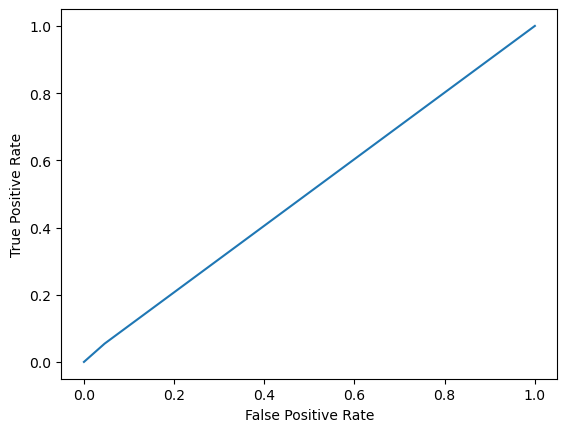

In [43]:

fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

In [44]:
print(f'Random Forest AUC score: {roc_auc_score(y_test, y_pred)}')


Random Forest AUC score: 0.504302908766326


#### 3.3. Confusion Matrix

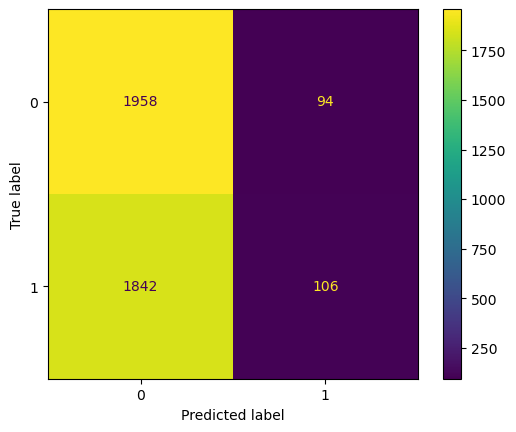

In [45]:
confusion_matrix = metrics.confusion_matrix(y_test, y_pred)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [0, 1])

cm_display.plot()
plt.show()

### 3. Feature Importance

In [46]:
temp = dataset_encoded.columns.tolist()

In [47]:
feature_names = temp[:-1]

In [48]:
len(feature_names)

160

In [49]:
random_forest_model.feature_importances_

array([0.02738323, 0.08023451, 0.05548181, 0.07572235, 0.        ,
       0.00423821, 0.        , 0.        , 0.        , 0.00462547,
       0.00343462, 0.        , 0.        , 0.0049984 , 0.        ,
       0.        , 0.01066558, 0.00439293, 0.00488346, 0.00798356,
       0.        , 0.        , 0.        , 0.01254237, 0.00439265,
       0.        , 0.01684365, 0.        , 0.01460694, 0.        ,
       0.        , 0.        , 0.001618  , 0.00364119, 0.00261145,
       0.01651322, 0.        , 0.        , 0.03595715, 0.        ,
       0.01953878, 0.        , 0.        , 0.00448394, 0.02225058,
       0.        , 0.        , 0.00616549, 0.00445436, 0.        ,
       0.        , 0.        , 0.00763005, 0.        , 0.        ,
       0.00318384, 0.02455793, 0.01431686, 0.00965596, 0.00605162,
       0.        , 0.00346287, 0.        , 0.01005694, 0.        ,
       0.        , 0.01777777, 0.00128608, 0.        , 0.        ,
       0.        , 0.00253793, 0.        , 0.00498764, 0.00236

In [66]:
plt.rcParams.update({'figure.figsize': (6, 6)})
plt.rcParams.update({'font.size': 10})

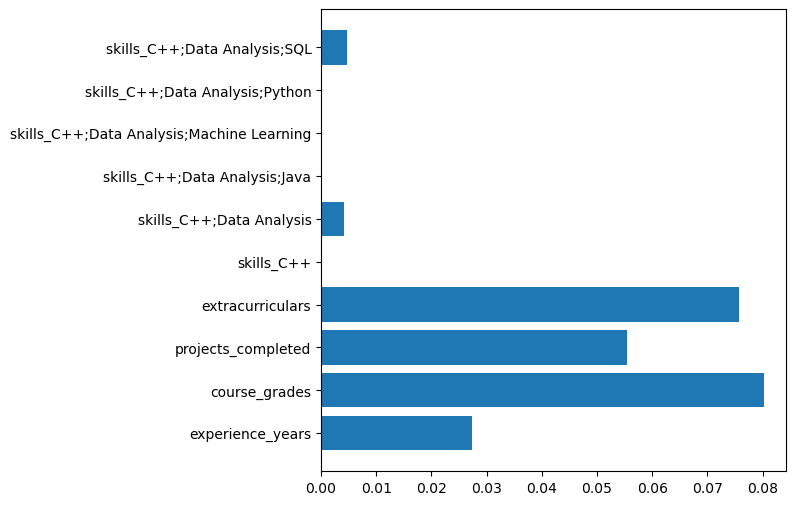

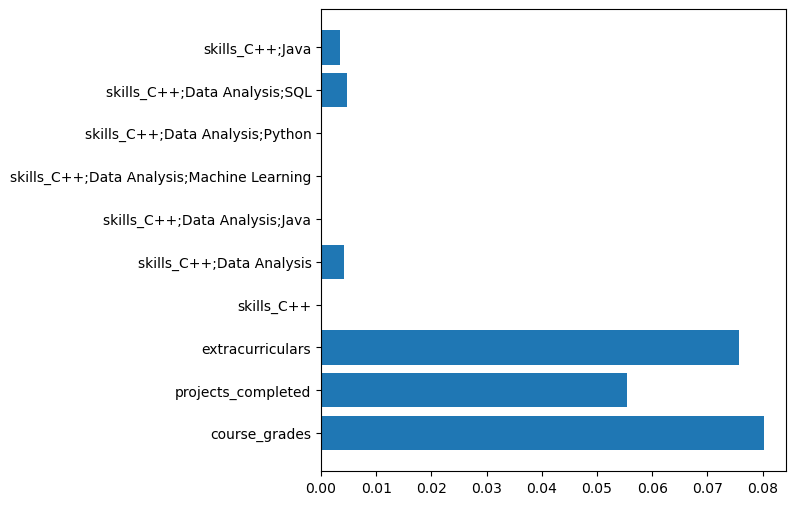

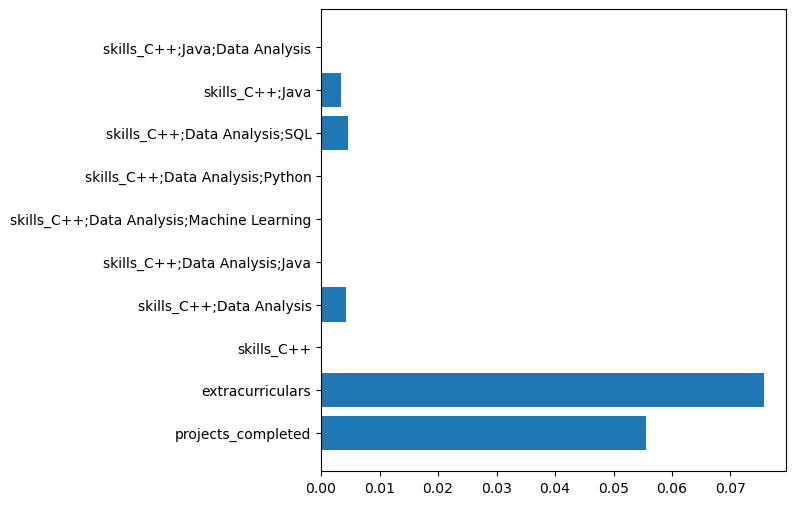

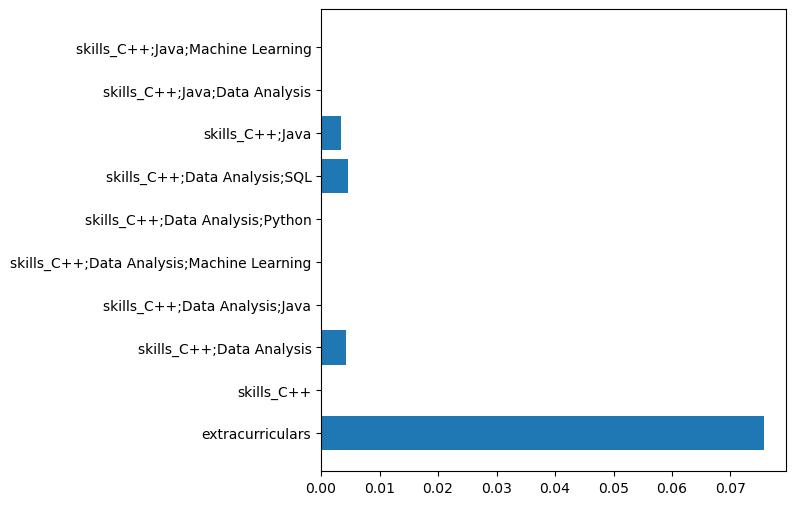

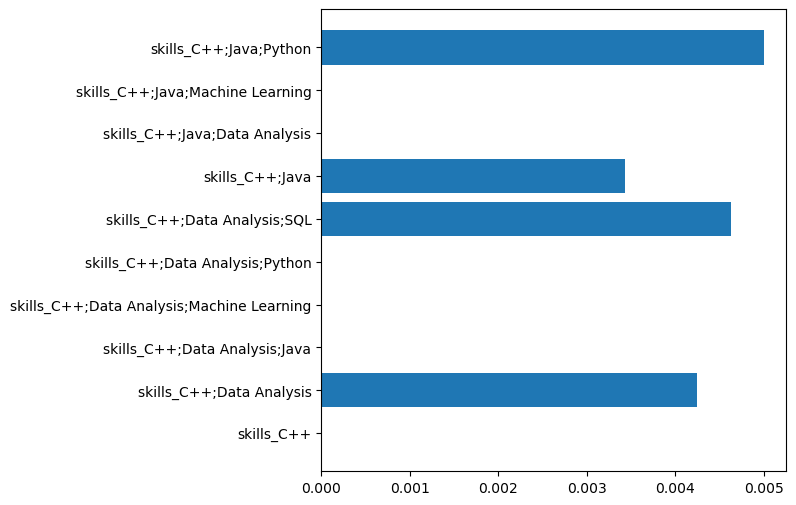

...

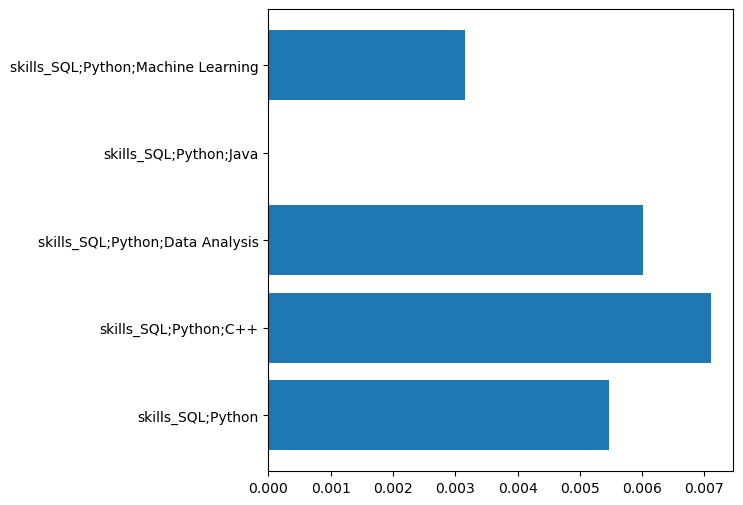

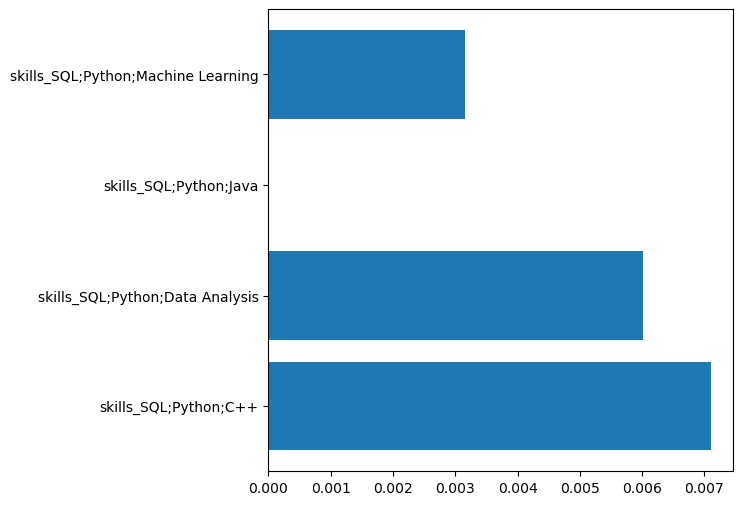

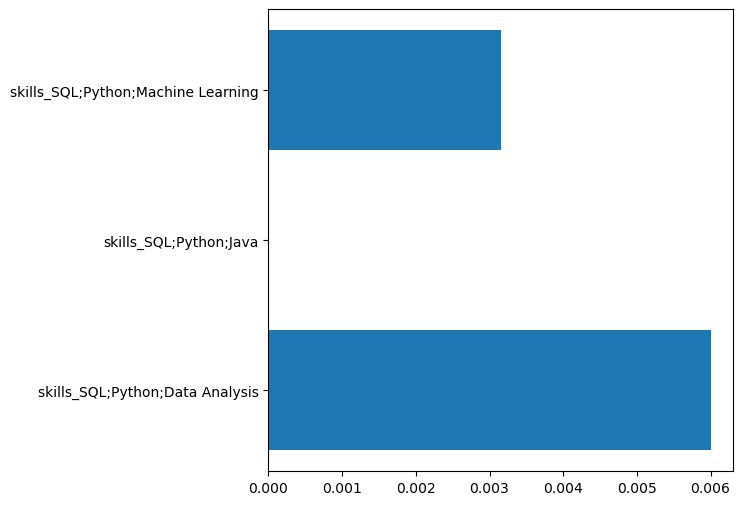

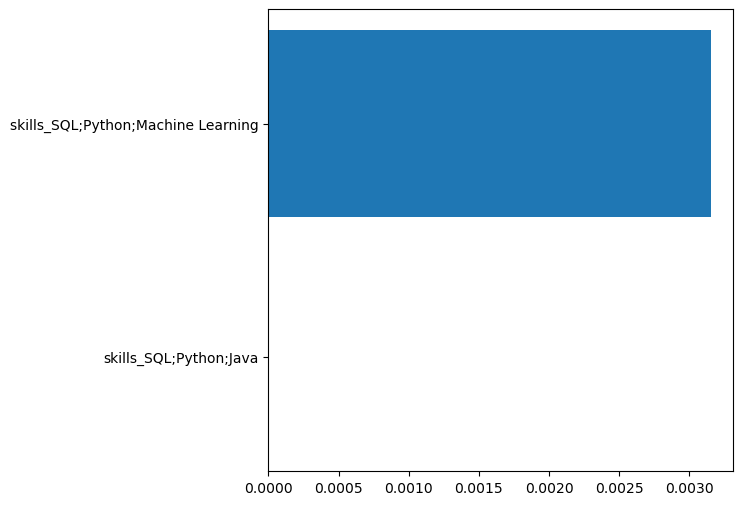

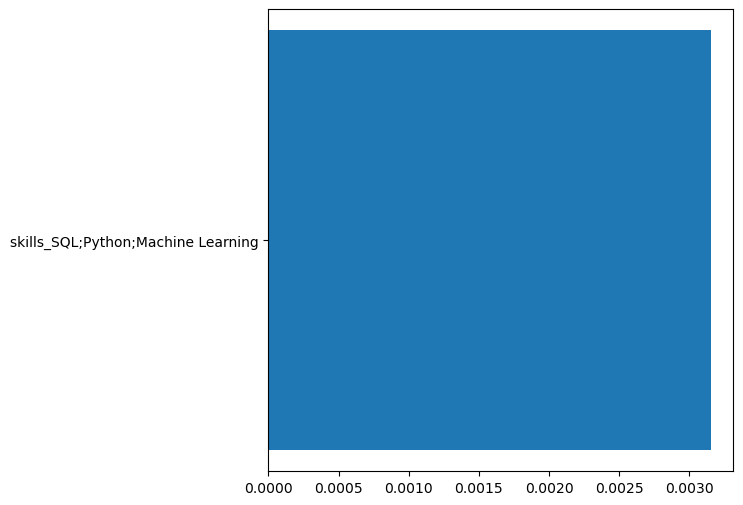

In [69]:
# As the no. of features is big , I divided the plotting so each 10 features in a single graph 
for i in range(len(feature_names)):
    plt.barh(feature_names[i:10+i], random_forest_model.feature_importances_[i:10+i])
    plt.show()
    i += 10



#### Permutation Based Feature Importance using permutation

In [53]:
from sklearn.inspection import permutation_importance

In [54]:
perm_importance = permutation_importance(random_forest_model, X_test, y_test)


In [61]:
print("Feature Name", "      ", "Its importance value")
print("-------------------------------------------------")
for i in range(len(feature_names)):
    print(feature_names[i], "      ",perm_importance.importances_mean[i])

Feature Name        Its importance value
-------------------------------------------------
experience_years        -0.0006999999999999895
course_grades        0.0037000000000000145
projects_completed        0.0027000000000000136
extracurriculars        0.0016000000000000014
skills_C++        0.0
skills_C++;Data Analysis        4.999999999999449e-05
skills_C++;Data Analysis;Java        0.0
skills_C++;Data Analysis;Machine Learning        0.0
skills_C++;Data Analysis;Python        0.0
skills_C++;Data Analysis;SQL        0.0
skills_C++;Java        -4.999999999999449e-05
skills_C++;Java;Data Analysis        0.0
skills_C++;Java;Machine Learning        0.0
skills_C++;Java;Python        0.0
skills_C++;Java;SQL        0.0
skills_C++;Machine Learning        0.0
skills_C++;Machine Learning;Data Analysis        -0.0005999999999999784
skills_C++;Machine Learning;Java        -4.999999999999449e-05
skills_C++;Machine Learning;Python        4.999999999999449e-05
skills_C++;Machine Learning;SQL       

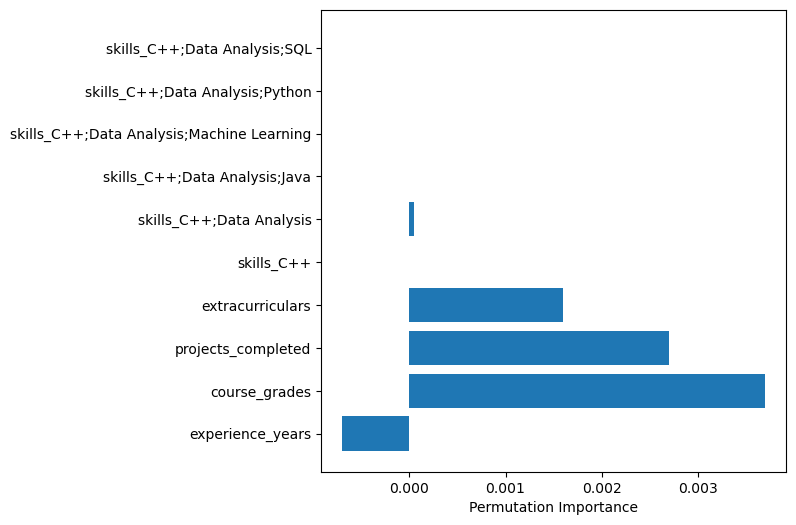

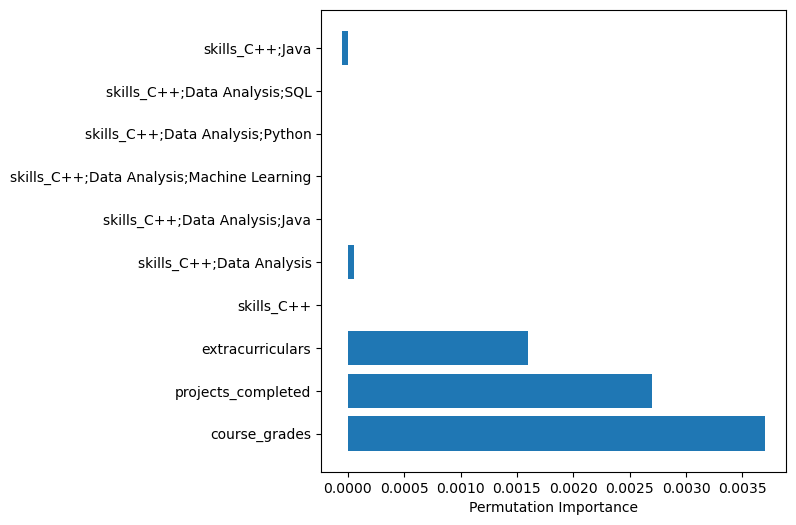

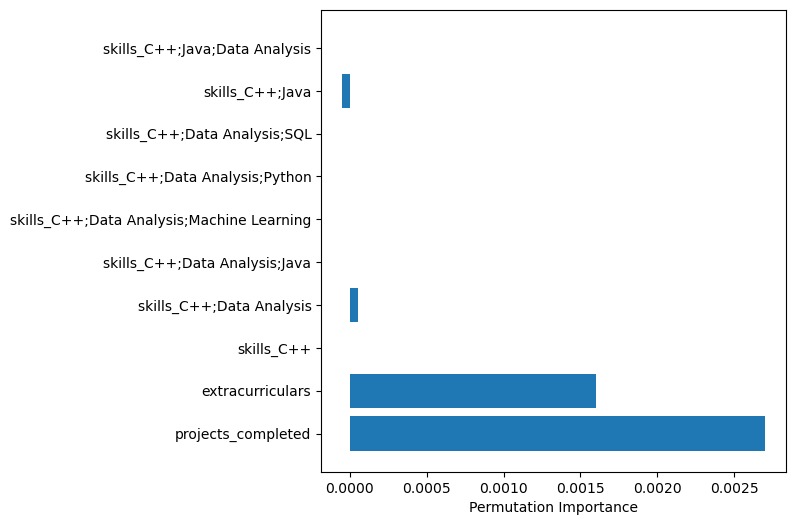

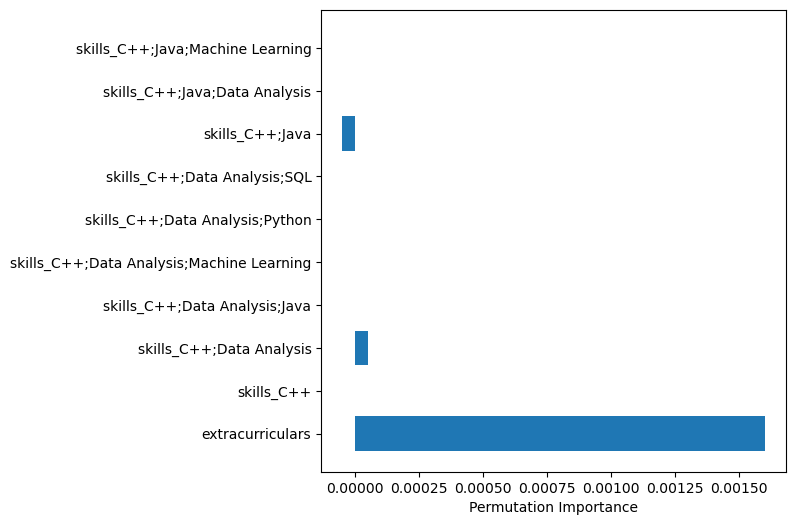

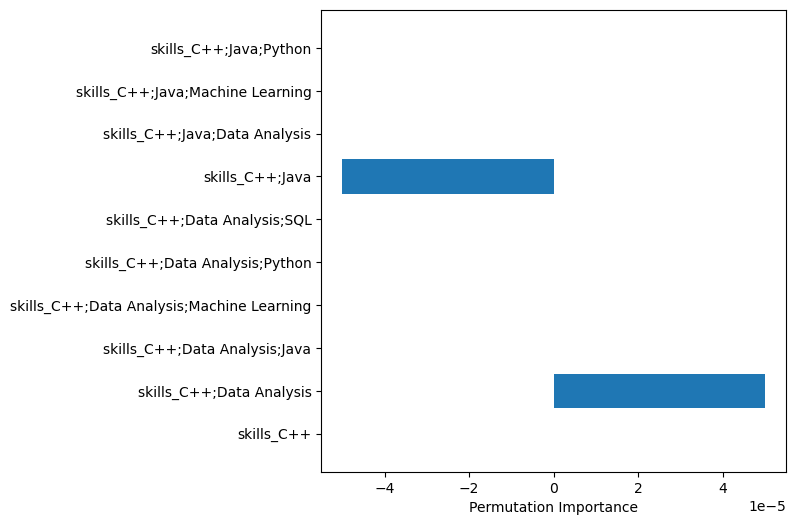

...

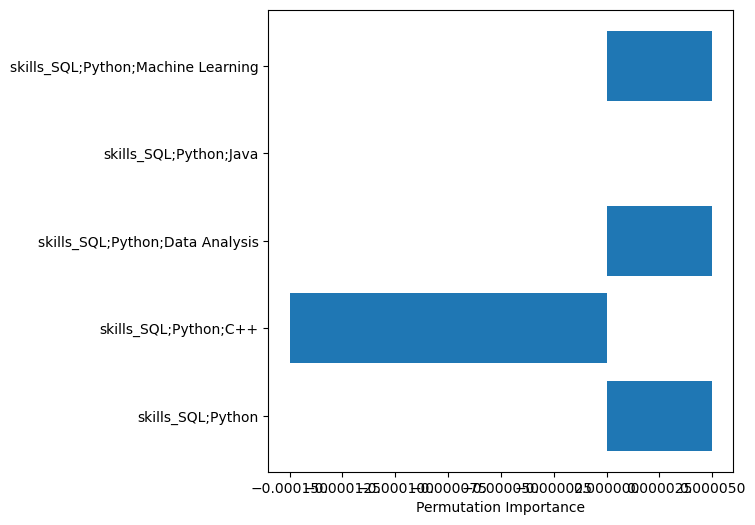

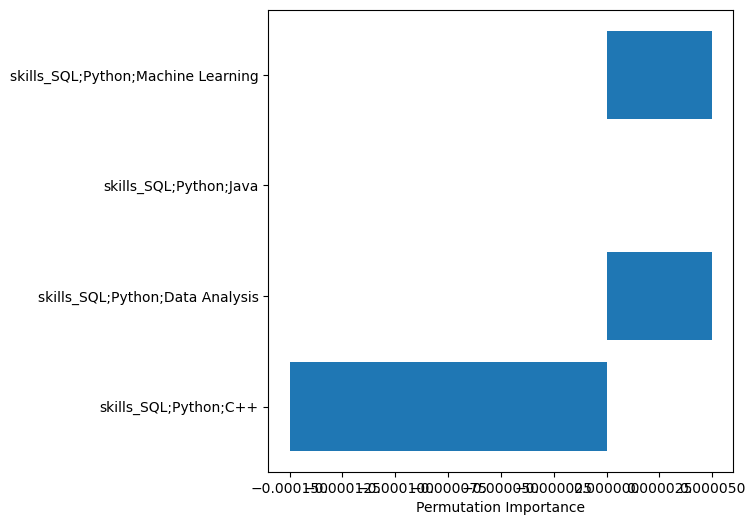

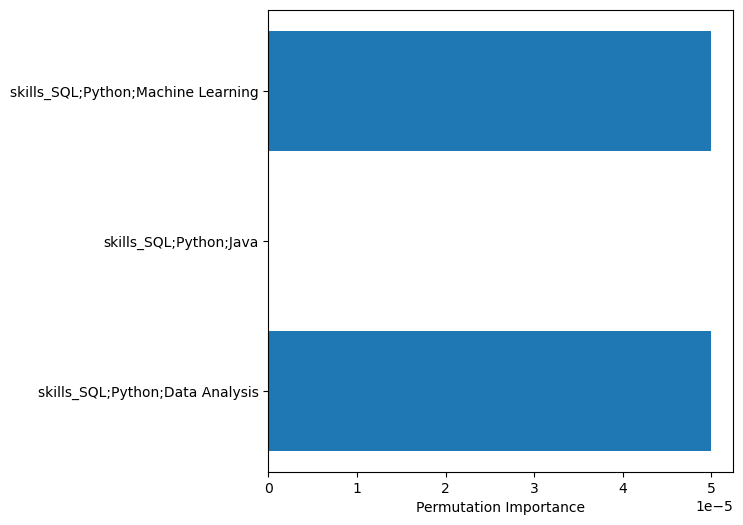

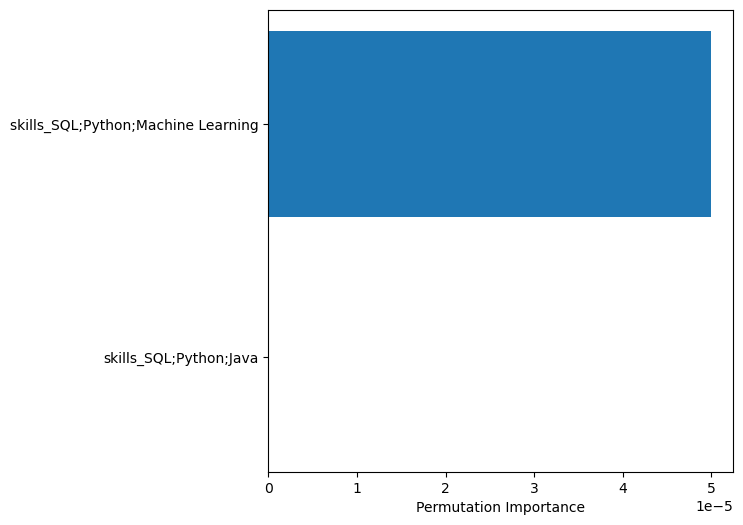

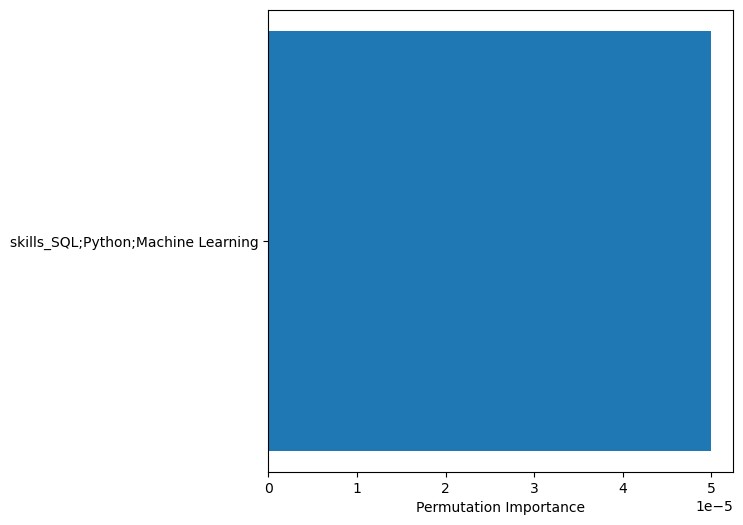

In [67]:
# As the no. of features is big , I divided the plotting so each 10 features in a single graph 
for i in range(len(feature_names)):
    plt.barh(feature_names[i:10+i], perm_importance.importances_mean[i:10+i])
    plt.xlabel("Permutation Importance")
    plt.show()
    i += 10

## 4. Model Evaluation 

In [70]:
from sklearn.model_selection import KFold, cross_val_score

In [75]:
X_train_scaled.shape , y.shape

((19998, 160), (19998,))

In [76]:
k_folds = KFold(n_splits = 5)

scores = cross_val_score(random_forest_model, X_train_scaled, y, cv = k_folds)

In [77]:
print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.50175    0.514      0.50625    0.50612653 0.50562641]
Average CV Score:  0.5067505876469118
Number of CV Scores used in Average:  5


## 5. Conclusion

#### According to K-fold method there is an underfitting , this is also shown in the <font color=green>graphs</font>  that applying different parameters in random-forest such as (min_samples_split, n_estimators, ..). Those graphs show that the accuracy of the training set is higher than the validation set which tells us that there is an underfitting . 
[<font color=green>Graphs</font> I mean starts from here](#2.2.1)